## Описание файла 
Скрипт выполняет полноценный разведочный анализ данных (EDA) датасета. Цель анализа – понять структуру данных, оценить их качество и подготовить чистую выборку для будущей модели сопоставления.

## Основные возможности EDA
Скрипт разбит на логические блоки:

* **Общая информация и распределения**  
  Подсчёт уникальных товаров, распределение размеров групп `label_group`, визуализация крупнейших категорий.

* **Поиск и анализ дубликатов**  
  - Выявление визуальных копий через перцептивные хеши (`phash`).  
  - Обнаружение «скрытых» дубликатов (одинаковая картинка сохранена под разными именами).  
  - Поиск конфликтных записей – когда одно изображение ошибочно отнесено к разным группам товаров.

* **Очистка данных**  
  Функция `clean_shopee_data` автоматически удаляет полные дубликаты и разрешает противоречия в разметке.

* **Анализ изображений**  
  - Расчёт геометрических характеристик: ширина, высота, площадь, соотношение сторон.  
  - Оценка чёткости (blur score) с помощью дисперсии Лапласиана.  
  - Визуализация пограничных случаев: самые большие, самые маленькие и непропорциональные снимки.

* **Анализ текста**  
  Статистика заголовков: длина строк, количество слов, проверка уникальности описаний внутри группы. Это помогает оценить разнообразие формулировок для одного и того же товара.

## Установка и зависимости

Для работы скрипта убедитесь, что в вашей среде установлены следующие библиотеки:
* `numpy`
* `pandas`
* `matplotlib`
* `seaborn`
* `opencv-python` (`cv2`)
* `Pillow` (`PIL`)
* `tqdm`

## Инструкция по использованию

1. **Подготовка данных:** По умолчанию скрипт настроен на файловую систему Kaggle и ищет данные по пути `/kaggle/input/competitions/shopee-product-matching/`. Убедитесь, что по этому пути находятся файлы `train.csv` и папка `train_images/`.
2. **Локальный запуск:** Если вы работаете на локальном компьютере, откройте скрипт и измените значение переменной `BASE_DIR` на актуальный путь к вашему набору данных.
3. **Запуск:** Выполните скрипт в вашей среде разработки. В процессе работы скрипт будет поэтапно выводить статистику в консоль и отображать графики и сетки изображений для наглядности.

## Импорт библиотек и загрузка датасета

In [1]:
import os
import cv2
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm.notebook import tqdm
from collections import Counter
import albumentations as A
from typing import Optional, Tuple, List
from sklearn.model_selection import GroupShuffleSplit

In [2]:
BASE_DIR = '/kaggle/input/competitions/shopee-product-matching/'
CSV_PATH = f'{BASE_DIR}train.csv'
IMAGE_DIR = f'{BASE_DIR}train_images/'
DATASET_MEAN_COLOR = (124, 116, 104) # Средний цвет ImageNet

In [3]:
df = pd.read_csv(CSV_PATH)

## Функции

In [4]:
def load_image(image_name: str, img_dir: str = IMAGE_DIR) -> Optional[Image.Image]:
    """
    Безопасно загружает изображение из указанной папки.
    """
    path = os.path.join(img_dir, image_name)
    try:
        return Image.open(path)
    except Exception:
        return None

In [5]:
def display_images(
    image_names: List[str],
    titles: Optional[List[str]] = None,
    rows: int = 1,
    cols: int = 1,
    img_dir: str = IMAGE_DIR,
    suptitle: Optional[str] = None,
    figsize: Optional[Tuple[int, int]] = None
) -> None:
    """
    Универсальная функция отображения сетки изображений.
    Каждое изображение подписывается заголовком (если передан)
    """
    # Если заголовки не переданы, создаём список пустых строк той же длины
    if titles is None:
        titles = [""] * len(image_names)

    # Ограничиваем число показываемых картинок размером сетки
    n = min(len(image_names), rows * cols)
    if figsize is None:
        figsize = (4 * cols, 4 * rows)

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    # Приводим оси к одномерному списку для удобства
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = np.array(axes).flatten()

    # Заполняем первые n ячеек изображениями
    for i in range(n):
        ax = axes[i]
        img = load_image(image_names[i], img_dir)
        if img is not None:
            ax.imshow(img)
            ax.set_title(titles[i][:30])
        else:
            ax.text(0.5, 0.5, f"Ошибка\n{image_names[i][:10]}",
                    ha='center', va='center', fontsize=8)
        ax.axis('off')

    # Скрываем лишние оси
    for i in range(n, len(axes)):
        axes[i].axis('off')

    if suptitle:
        fig.suptitle(suptitle, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.96] if suptitle else None)
    plt.show()

In [6]:
def visualize_top_groups(
    df: pd.DataFrame,
    n_groups: int = 3,
    img_dir: str = IMAGE_DIR,
    max_cols: int = 8
) -> None:
    """
    Показывает топ‑n_groups самых больших групп товаров: статистику и их изображения.
    """
    # Определяем n_groups групп с наибольшим количеством записей
    top_groups = df['label_group'].value_counts().nlargest(n_groups).index
    for group in top_groups:
        # Фильтруем DataFrame, оставляя только строки текущей группы
        group_df = df[df['label_group'] == group]
        n_images = len(group_df)                         # общее количество изображений в группе
        unique_phash = group_df['image_phash'].nunique() # число уникальных хешей

        # Определяем размер сетки для отображения изображений
        cols = min(max_cols, n_images)
        rows = int(np.ceil(n_images / cols))
        # Формируем  подписи
        titles = [f"{name[:15]}" for name in group_df['image']]

        display_images(
            group_df['image'].tolist(),
            titles=titles,
            rows=rows,
            cols=cols,
            suptitle=f"Группа {group} ({n_images} изображений, {unique_phash} уникальных phash)"
        )

In [7]:
def analyze_low_diversity_groups(
    df: pd.DataFrame,
    top_n: int = 5
) -> pd.DataFrame:
    """
    Находит группы с наибольшим количеством визуальных дубликатов и более чем 5 изображениями
    """
    # Считаем количество картинок и уникальных phash для каждой группы
    diversity_stats = df.groupby('label_group').agg(
        n_images=('image', 'count'),
        n_unique_phash=('image_phash', 'nunique')
    )
    
    # Считаем коэффициент разнообразия (чем ближе к 0, тем больше дубликатов)
    diversity_stats['diversity_ratio'] = diversity_stats['n_unique_phash'] / diversity_stats['n_images']
    
    # Фильтруем группы, где хотя бы больше 5 изображений
    # И сортируем по возрастанию разнообразия
    low_diversity = diversity_stats[diversity_stats['n_images'] > 5].sort_values(by='diversity_ratio').head(top_n)
    
    print(f"Топ-{top_n} групп с самым низким визуальным разнообразием:")
    display(low_diversity)

In [8]:
def visualize_hidden_duplicates(
    df: pd.DataFrame,
    n_groups: int = 3,
    img_dir: str = IMAGE_DIR,
    max_samples_per_phash: int = 5
) -> None:
    """
    Показывает изображения с одинаковым phash, но разными именами файлов.
    """
    # Считаем, сколько уникальных имён файлов приходится на каждый phash
    phash_file_counts = df.groupby('image_phash')['image'].nunique()
    # Оставляем только те phash, у которых больше одного имени файла
    hidden_dups = phash_file_counts[phash_file_counts > 1].index.tolist()
    # Если таких phash нет, сообщаем и выходим
    if not hidden_dups:
        print("Скрытых дубликатов (разные имена, один phash) не найдено.")
        return

    # Берём первые n_groups скрытых дубликатов для демонстрации
    selected = hidden_dups[:n_groups]
    # Для каждого выбранного phash выводим изображения
    for phash in selected:
        group_df = df[df['image_phash'] == phash]
        image_names = group_df['image'].head(max_samples_per_phash).tolist()
        titles = [f"{name}" for name in image_names]
        display_images(
            image_names,
            titles=titles,
            rows=1,
            cols=len(image_names),
            suptitle=f"PHASH: {phash} (всего изображений: {len(group_df)})"
        )

In [9]:
def visualize_cross_group_duplicates(
    df: pd.DataFrame,
    n_examples: int = 3,
    img_dir: str = IMAGE_DIR
) -> None:
    """
    Показывает изображения с одинаковым phash, но отнесённые к разным label_group.
    """
    # Считаем количество уникальных label_group для каждого image_phash
    phash_group_counts = df.groupby('image_phash')['label_group'].nunique()
    # Оставляем только те phash, которые встречаются более чем в одной группе
    conflicting_phashes = phash_group_counts[phash_group_counts > 1].index.tolist()
    # Если конфликтов нет, сообщаем и выходим
    if not conflicting_phashes:
        print("Конфликтующих phash не найдено.")
        return

    # Берём первые n_examples конфликтных хешей для демонстрации
    selected = conflicting_phashes[:n_examples]
    # Для каждого такого phash показываем по одному представителю из каждой группы
    for phash in selected:
        sub = df[df['image_phash'] == phash]
        groups = sub['label_group'].unique()
        samples = [sub[sub['label_group'] == g].iloc[0] for g in groups]
        image_names = [row['image'] for row in samples]
        titles = [f"Группа: {row['label_group']}\n{row['image']}" for row in samples]
        display_images(
            image_names,
            titles=titles,
            rows=1,
            cols=len(samples),
            suptitle=f"PHASH: {phash} (конфликтует между {len(groups)} группами)"
        )

In [10]:
def clean_shopee_data(df: pd.DataFrame) -> pd.DataFrame:
    """
    Удаляет полные дубликаты по паре (image_phash, label_group) и все строки с phash, которые одновременно относятся к разным группам, устраняя конфликты разметки.
    """
    initial_len = len(df)

    # Удаляем полные дубликаты (одна и та же картинка в одной и той же группе)
    # Используем комбинацию phash и label_group
    df = df.drop_duplicates(subset=['image_phash', 'label_group'], keep='first')
    print(f" Удалено полных дублей в группах: {initial_len - len(df)}")

    # Обработка конфликтов: одна картинка в разных группах
    # Находим phash, которые привязаны более чем к одной группе
    tmp = df.groupby('image_phash')['label_group'].nunique()
    conflicting_phashes = tmp[tmp > 1].index

    if len(conflicting_phashes) > 0:
        # Удаляем такие записи чтобы модель не получала противоречивых сигналов  
        pre_conflict_len = len(df)
        df = df[~df['image_phash'].isin(conflicting_phashes)]
        print(f" Удалено строк с конфликтующими метками: {pre_conflict_len - len(df)}")
    else:
        print(" Конфликтов между группами не обнаружено.")

     # Одиночки
    pre_single = len(df)
    group_counts = df['label_group'].value_counts()
    keep_groups = group_counts[group_counts >= 2].index
    df = df[df['label_group'].isin(keep_groups)].reset_index(drop=True)
    print(f"Удалено одиночных групп: {pre_single - len(df)}")
    print(f"Итоговый размер после очистки: {len(df)} (было {initial_len})")

    return df

In [11]:
def visualize_cleaned_groups(
    df_clean: pd.DataFrame,
    n_groups: int = 10,
    img_dir: str = IMAGE_DIR
) -> None:
    """
    Показывает содержимое нескольких случайных групп после очистки (минимум 2 изображения).
    """
    # Получаем количество записей в каждой группе
    groups = df_clean['label_group'].value_counts()
    # Оставляем только группы, в которых минимум 2 изображения
    groups = groups[groups >= 2].index.tolist()

    # Случайным образом выбираем n_groups из подходящих групп (или все, если их меньше)
    sample_groups = np.random.choice(groups, size=min(n_groups, len(groups)), replace=False)
    # Для каждой выбранной группы отображаем все её изображения в один ряд
    for group in sample_groups:
        group_df = df_clean[df_clean['label_group'] == group]
        image_names = group_df['image'].tolist()
        display_images(
            image_names,
            rows=1,
            cols=len(image_names),
            suptitle=f"Группа: {group} (всего изображений: {len(group_df)})"
        )

In [12]:
def group_size_distribution(
    df: pd.DataFrame,
    threshold: int = 10
) -> None:
    """
    Показывает распределение размеров групп (количество групп заданного размера).
    """
    sizes = df['label_group'].value_counts()
    valid_sizes = sizes[sizes > threshold]
    if valid_sizes.empty:
        print(f"Нет групп с размером > {threshold}")
        return
    dist = valid_sizes.value_counts().sort_index(ascending=False)
    dist_df = pd.DataFrame({'изображений': dist.index, 'групп': dist.values})
    print(f"Распределение размеров групп > {threshold}:")
    print(dist_df.to_string(index=False))

In [13]:
def get_image_info(image_path: str) -> Optional[Tuple[int, int, float]]:
    """
    Извлекает базовые характеристики изображения: размеры и оценку чёткости.
    """
    try:
        img = cv2.imread(image_path)
        if img is None: return None
        h, w, c = img.shape
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blur_score = cv2.Laplacian(gray, cv2.CV_64F).var()
        return h, w, blur_score
    except:
        return None

In [14]:
def compute_dataset_mean_color(
    df: pd.DataFrame,
    img_dir: str = IMAGE_DIR,
    sample_size: Optional[int] = None
) -> Tuple[int, int, int]:
    """
    Вычисляет средний цвет (R, G, B) по всем (или по выборке) изображениям датасета.
    Возвращает кортеж из трёх целых чисел.
    """
    # Если указан размер выборки и она меньше общего числа изображений,
    # случайно отбираем sample_size имён файлов
    if sample_size and len(df) > sample_size:
        image_names = random.sample(df['image'].tolist(), sample_size)
    else:
        image_names = df['image'].tolist()

    # Накопительные суммы для трёх каналов и общее количество пикселей
    sum_r, sum_g, sum_b = 0.0, 0.0, 0.0
    total_pixels = 0
    for name in tqdm(image_names, desc='Средний цвет датасета'):
        try:
            # Открываем изображение, конвертируем в RGB (на случай палитровых форматов)
            img = Image.open(os.path.join(img_dir, name)).convert('RGB')
            # Преобразуем в numpy-массив с типом float64 для точности при суммировании
            arr = np.array(img, dtype=np.float64)
            h, w, _ = arr.shape
            # Суммируем значения каждого канала по всем пикселям
            sum_r += arr[:, :, 0].sum()
            sum_g += arr[:, :, 1].sum()
            sum_b += arr[:, :, 2].sum()
            total_pixels += h * w
        except Exception as e:
            print(f"Проблема с {name}: {e}")
            continue
            
    # Если не было обработано ни одного пикселя, возвращаем нейтральный серый (128,128,128)
    if total_pixels == 0:
        return (128, 128, 128)  
    # Вычисляем средние по всем накопленным пикселям и округляем до целого
    mean_r = int(round(sum_r / total_pixels))
    mean_g = int(round(sum_g / total_pixels))
    mean_b = int(round(sum_b / total_pixels))
    return (mean_r, mean_g, mean_b)

In [15]:
def visualize_extreme_images(
    sample_df: pd.DataFrame,
    img_dir: str = IMAGE_DIR,
    n_smallest: int = 2,
    n_largest: int = 2,
    n_horizontal: int = 2,
    n_vertical: int = 2,
    img_size: int = 224,
    dataset_mean_color: tuple = DATASET_MEAN_COLOR
) -> None:
    """
    Показывает граничные по геометрии изображения:
    - самые маленькие и самые большие по площади,
    - самые вытянутые по горизонтали и вертикали.
    в трёх вариантах:
    - оригинал,
    - resize ровно img_size × img_size,
    - A.LongestMaxSize + PadIfNeeded с заполнением средним цветом датасета.
    Каждое изображение выводится в отдельной строке с подписями методов обработки.
    """
    # Собираем граничные примеры
    df = sample_df.copy()
    # Вычисляем площадь и соотношение сторон
    if 'area' not in df.columns:
        df['area'] = df['width'] * df['height']
    if 'aspect_ratio' not in df.columns:
        df['aspect_ratio'] = df['width'] / df['height']

    smallest = df.nsmallest(n_smallest, 'area')
    largest = df.nlargest(n_largest, 'area')
    horizontal = df.nlargest(n_horizontal, 'aspect_ratio')
    vertical = df.nsmallest(n_vertical, 'aspect_ratio')

    # Объединяем все отобранные строки и убираем дубликаты по имени файла
    boundary = pd.concat([smallest, largest, horizontal, vertical]).drop_duplicates(subset='image')
    image_names = boundary['image'].tolist()

    # Подготавливаем аугментацию с паддингом 
    # Создаём конвейер Albumentations:
    # 1) LongestMaxSize – масштабирует так, чтобы бóльшая сторона стала равна img_size
    # 2) PadIfNeeded – дополняет изображение до img_size×img_size средним цветом датасета
    pad_transform = A.Compose([
        A.LongestMaxSize(max_size=img_size),
        A.PadIfNeeded(
            min_height=img_size,
            min_width=img_size,
            border_mode=cv2.BORDER_CONSTANT,
            fill =dataset_mean_color 
        )
    ])

    # Строим сетку
    n_images = len(image_names)
    fig, axes = plt.subplots(n_images, 3, figsize=(12, 4 * n_images))
    if n_images == 1:
        axes = np.array([axes])  # чтобы была двумерная
    col_titles = ['Оригинал', f'Resize {img_size}×{img_size}', 'LongestMax + Pad']

    for row_idx, img_name in enumerate(image_names):
        try:
            img_pil = Image.open(os.path.join(img_dir, img_name)).convert('RGB')
        except Exception as e:
            print(f"Не удалось загрузить {img_name}: {e}")
            for col_idx in range(3):
                axes[row_idx, col_idx].text(0.5, 0.5, 'Ошибка', ha='center', va='center')
                axes[row_idx, col_idx].axis('off')
            continue

        # 1. Оригинал
        axes[row_idx, 0].imshow(img_pil)
        axes[row_idx, 0].set_title(f'{img_name}\n{img_pil.size[0]}×{img_pil.size[1]}', fontsize=8)
        axes[row_idx, 0].axis('off')

        # 2. Простой ресайз
        img_resized = img_pil.resize((img_size, img_size), Image.BILINEAR)
        axes[row_idx, 1].imshow(img_resized)
        axes[row_idx, 1].set_title(f'Resize {img_size}×{img_size}', fontsize=8)
        axes[row_idx, 1].axis('off')

        # 3. Albumentations обработка: масштабирование с сохранением пропорций и дополнение до квадрата
        img_np = np.array(img_pil) 
        augmented = pad_transform(image=img_np)['image']  # RGB, uint8
        axes[row_idx, 2].imshow(augmented)
        axes[row_idx, 2].set_title('LongestMax + Pad', fontsize=8)
        axes[row_idx, 2].axis('off')

    # Подписи столбцов сверху
    for col_idx, title in enumerate(col_titles):
        axes[0, col_idx].set_title(title, fontsize=10, weight='bold')

    plt.tight_layout()
    plt.show()

In [16]:
def train_split (
    df_clean: pd.DataFrame,
    train_size: float = 0.70,
    random_state: int = 42
) -> pd.DataFrame:
    # Разбиение с учётом групп, чтобы все изображения одного товара попали в одну выборку
    gss1 = GroupShuffleSplit(n_splits=1, test_size=1-train_size, random_state=random_state)
    train_idx, temp_idx = next(gss1.split(df_clean, groups=df_clean['label_group']))
    train_df = df_clean.iloc[train_idx].reset_index(drop=True)
    print(f"Train: {len(train_df)} ({train_df['label_group'].nunique()} групп)")
    return train_df    

##  Общая информация

In [17]:
df.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


In [18]:
print(f"Всего строк (изображений/товаров): {len(df)}")
print(f"Уникальных изображений (по имени файла): {df['image'].nunique()}")
print(f"Уникальных изображений (по phash): {df['image_phash'].nunique()}")
print(f"Уникальных групп товаров (label_group): {df['label_group'].nunique()}")

Всего строк (изображений/товаров): 34250
Уникальных изображений (по имени файла): 32412
Уникальных изображений (по phash): 28735
Уникальных групп товаров (label_group): 11014


In [19]:
# Размер классов
class_sizes = df['label_group'].value_counts()
print("\nРазмер классов (количество товаров в одной группе):")
print(f"Min: {class_sizes.min()}")
print(f"Max: {class_sizes.max()}")
print(f"Median: {class_sizes.median()}")
print(f"Mean: {class_sizes.mean():.2f}")


Размер классов (количество товаров в одной группе):
Min: 2
Max: 51
Median: 2.0
Mean: 3.11


In [21]:
analyze_low_diversity_groups(df) # Находит группы с наибольшим количеством визуальных дубликатов и более чем 5 изображениями

Топ-5 групп с самым низким визуальным разнообразием:


,n_images,n_unique_phash,diversity_ratio
label_group,,,
4198148727,16,1,0.062500
2294565205,12,1,0.083333
4292520070,11,1,0.090909
4216958894,10,1,0.100000
4070501594,10,1,0.100000


## Анализ дубликатов 

In [22]:
# Анализ дубликатов по phash
phash_dup_mask = df['image_phash'].duplicated(keep=False)
phash_dup_df = df[phash_dup_mask].sort_values('image_phash')
print(f"Всего дублированных строк по phash: {len(phash_dup_df)}")

# Проверим, находятся ли дубликаты phash в одной группе или в разных
same_group_phash = phash_dup_df.groupby('image_phash')['label_group'].nunique()
print(f"Дубликаты phash в одной группе: {(same_group_phash == 1).sum()}")
print(f"Дубликаты phash в разных группах (конфликты): {(same_group_phash > 1).sum()}")

Всего дублированных строк по phash: 8744
Дубликаты phash в одной группе: 3082
Дубликаты phash в разных группах (конфликты): 147


In [23]:
# Дополнительный анализ конфликтных phash
conflict_phash = same_group_phash[same_group_phash > 1].index        # список конфликтных phash
conflict_rows = df[df['image_phash'].isin(conflict_phash)]          # все строки с такими phash

print(f"Затронуто строк в конфликтных phash: {len(conflict_rows)} из {len(df)}")
print(f"Процент от общего числа строк: {len(conflict_rows)/ len(df) * 100:.2f}%")

Затронуто строк в конфликтных phash: 468 из 34250
Процент от общего числа строк: 1.37%


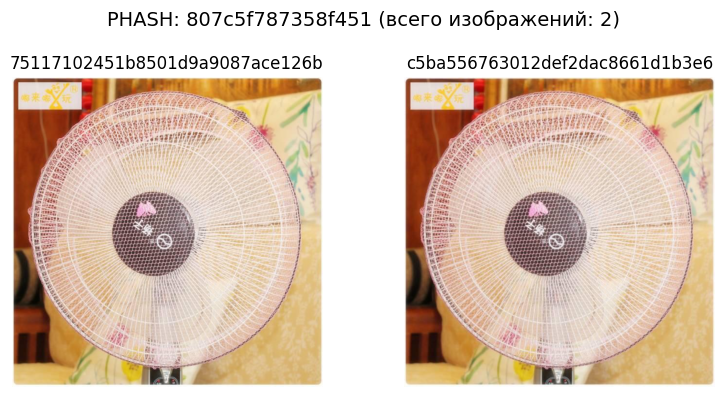

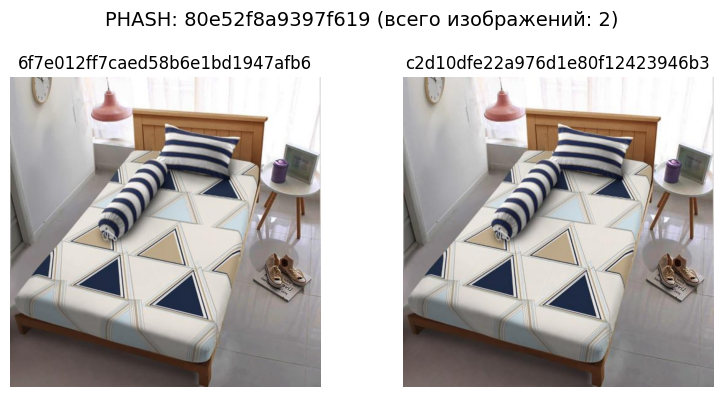

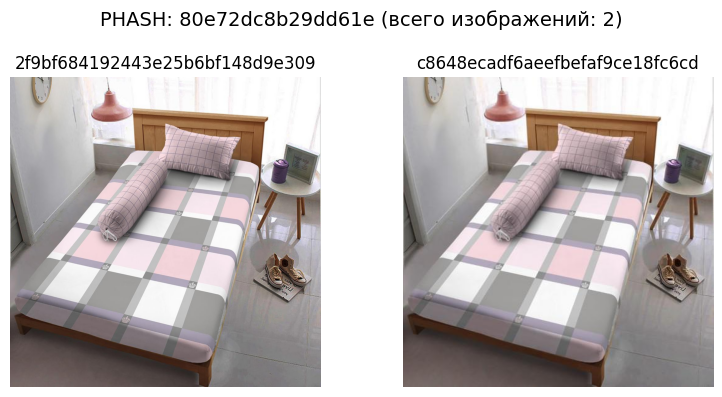

In [24]:
visualize_hidden_duplicates(df) # Показывает примеры изображений с одинаковым phash, но разными именами файлов.

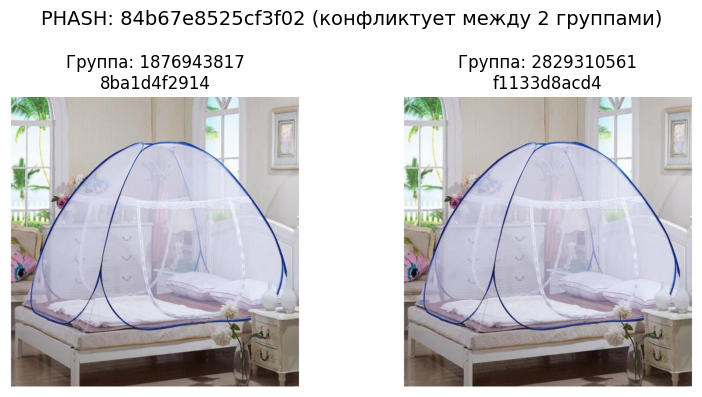

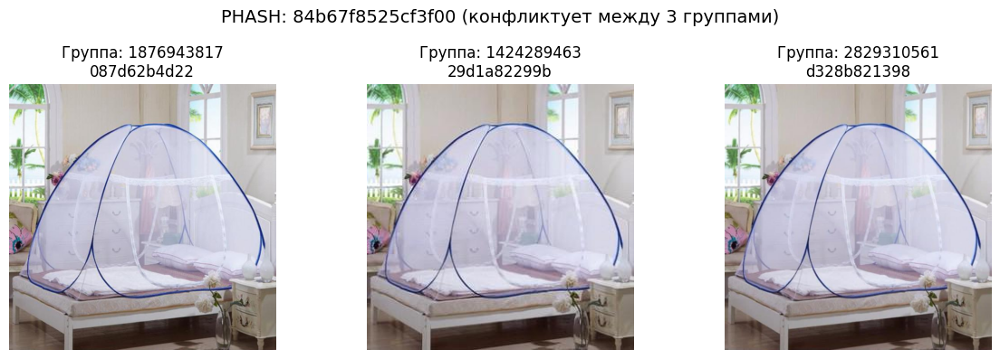

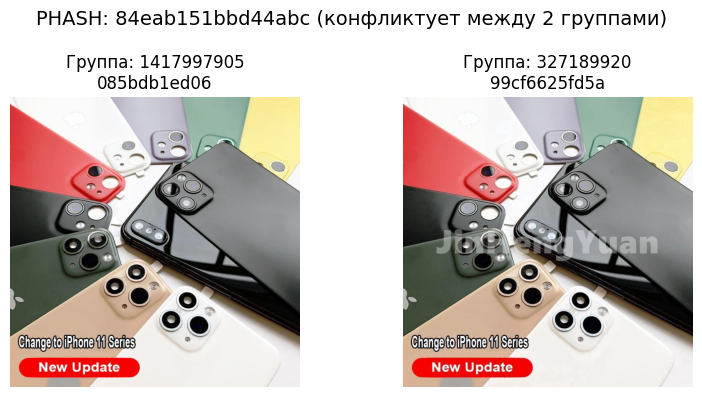

In [25]:
visualize_cross_group_duplicates(df) # Показывает изображения с одинаковым phash, но отнесённые к разным label_group

In [26]:
df_clean = clean_shopee_data(df)

 Удалено полных дублей в группах: 5358
 Удалено строк с конфликтующими метками: 304
Удалено одиночных групп: 1090
Итоговый размер после очистки: 27498 (было 34250)


In [27]:
print(f"Уникальных групп товаров после очистки: {df_clean['label_group'].nunique()}")
class_sizes = df_clean['label_group'].value_counts()

Уникальных групп товаров после очистки: 9901


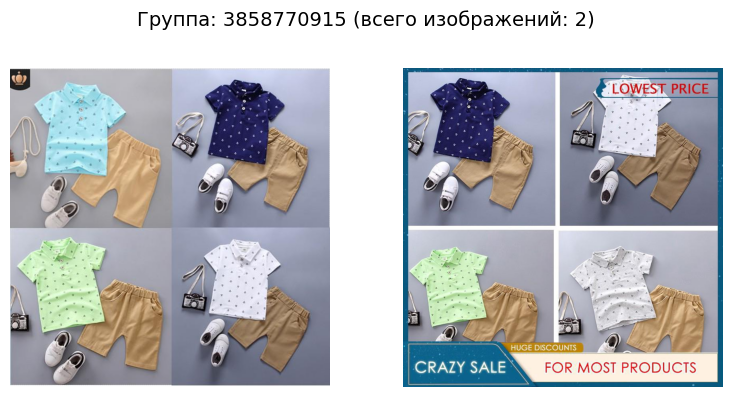

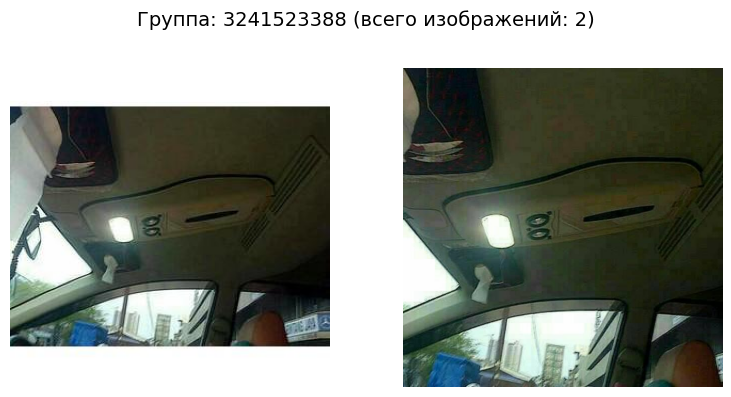

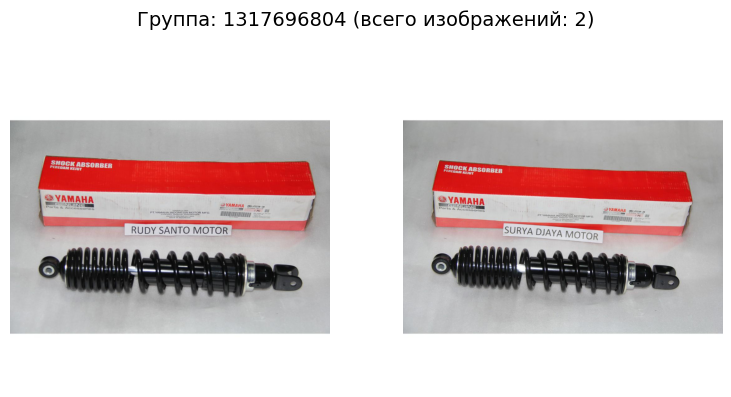

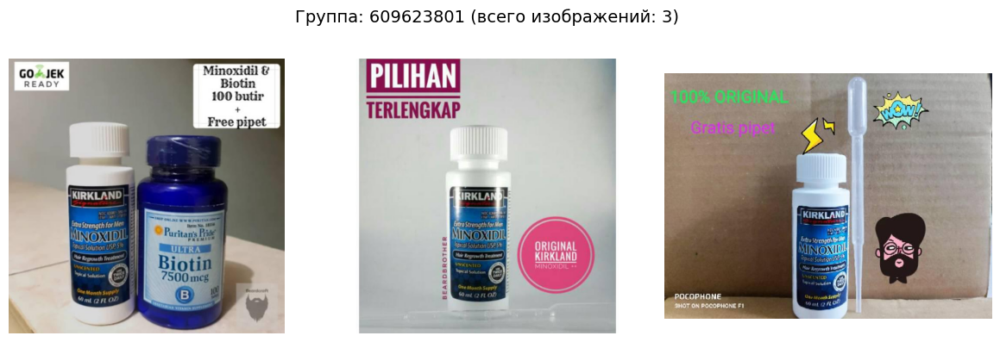

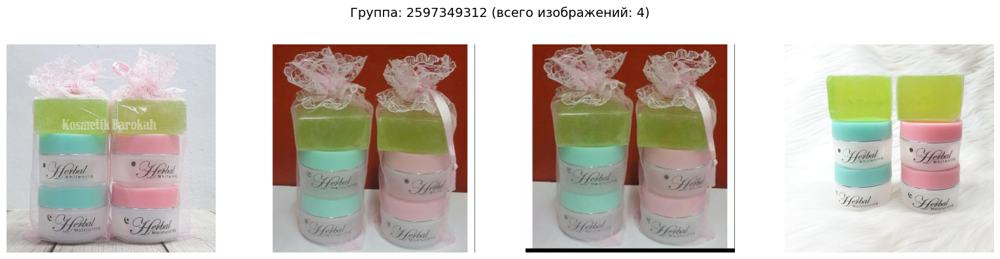

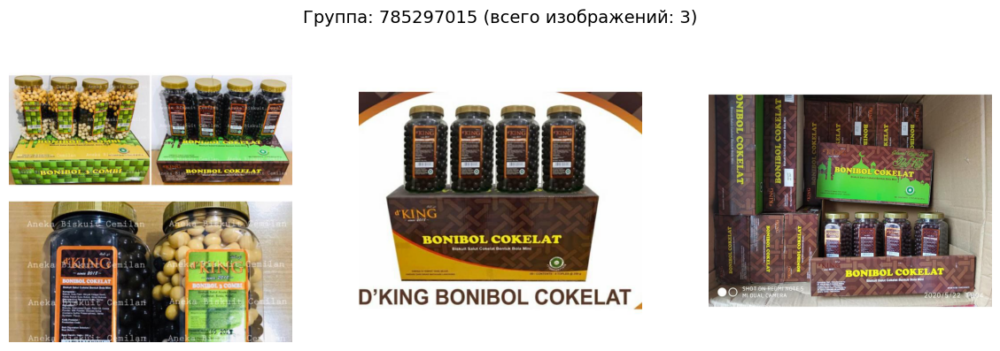

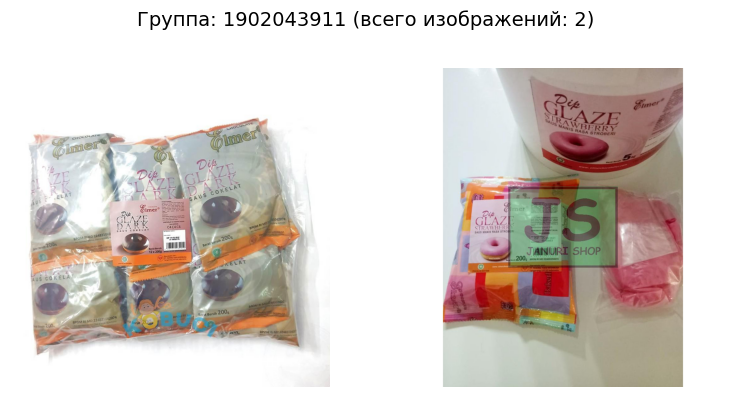

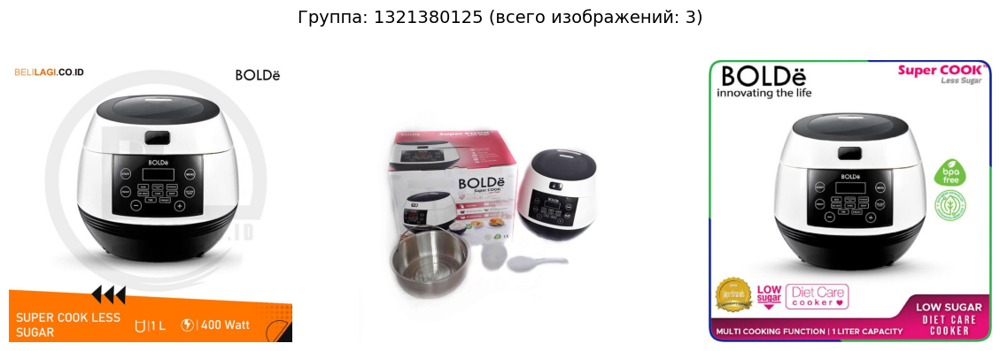

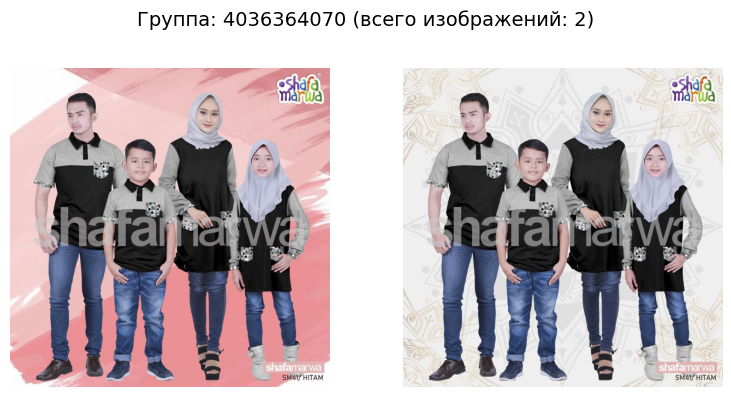

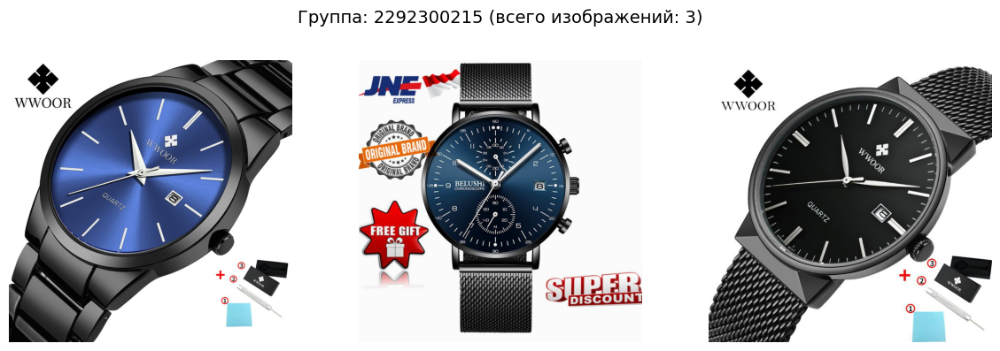

In [28]:
visualize_cleaned_groups(df_clean) # Показывет содержимое нескольких случайных групп товаров после очистки.

##  Распределение классов

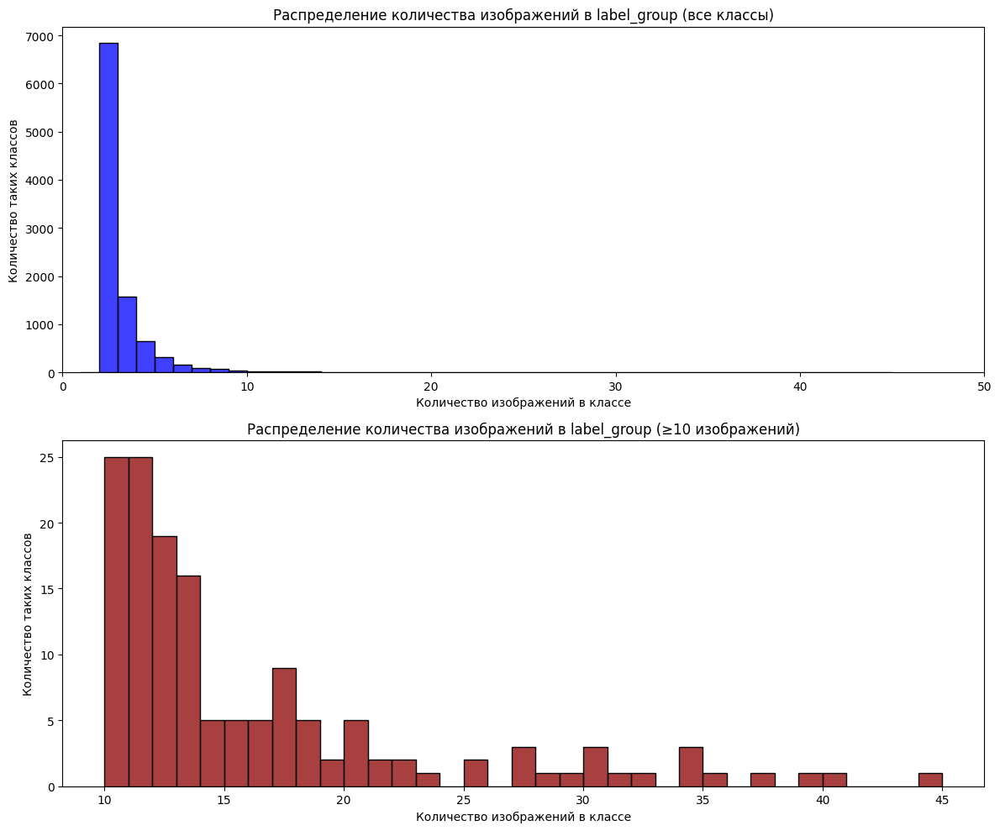

Классов с <= 2 элементами: 69.1%
Классов с >= 10 элементами: 1.5%


In [29]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Первый график: полное распределение
sns.histplot(class_sizes, bins=range(1, class_sizes.max() + 2), color='blue', ax=axes[0])
axes[0].set_title('Распределение количества изображений в label_group (все классы)')
axes[0].set_xlabel('Количество изображений в классе')
axes[0].set_ylabel('Количество таких классов')
axes[0].set_xlim(0, 50)

# Второй график: только группы с >= 10 изображений
class_sizes_ge10 = class_sizes[class_sizes >= 10]
sns.histplot(class_sizes_ge10, bins=range(10, class_sizes_ge10.max() + 2), color='darkred', ax=axes[1])
axes[1].set_title('Распределение количества изображений в label_group (≥10 изображений)')
axes[1].set_xlabel('Количество изображений в классе')
axes[1].set_ylabel('Количество таких классов')

plt.tight_layout()
plt.show()

print(f"Классов с <= 2 элементами: {(class_sizes <= 2).mean() * 100:.1f}%")
print(f"Классов с >= 10 элементами: {(class_sizes >= 10).mean() * 100:.1f}%")

In [30]:
group_size_distribution(df_clean) # Выводит распределение размеров групп с 10+ элементами

Распределение размеров групп > 10:
 изображений  групп
          44      1
          40      1
          39      1
          37      1
          35      1
          34      3
          32      1
          31      1
          30      3
          29      1
          28      1
          27      3
          25      2
          23      1
          22      2
          21      2
          20      5
          19      2
          18      5
          17      9
          16      5
          15      5
          14      5
          13     16
          12     19
          11     25


## Анализ изображений

In [31]:
sample_df = df_clean.sample(len(df_clean)).copy()
tqdm.pandas(desc="Анализ размеров и качества", leave=False)
sample_df[['height', 'width', 'blur_score']] = sample_df['image'].progress_apply(
    lambda x: pd.Series(get_image_info(os.path.join(IMAGE_DIR, x)))
)
# Размеры
print(f"Уникальные ширины: {sample_df['width'].nunique()}, Уникальные высоты: {sample_df['height'].nunique()}")

Анализ размеров и качества:   0%|          | 0/27498 [00:00<?, ?it/s]

Уникальные ширины: 748, Уникальные высоты: 745


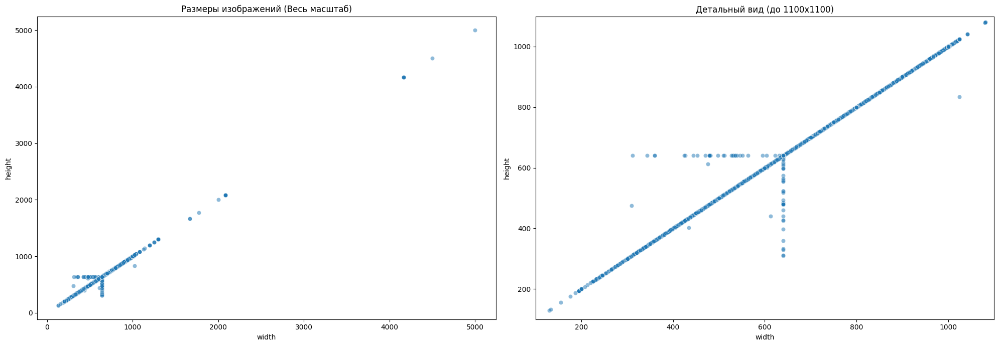

In [32]:
plt.figure(figsize=(20, 7)) # Увеличиваем общую ширину для двух графиков

plt.subplot(1, 2, 1)
sns.scatterplot(data=sample_df, x='width', y='height', alpha=0.5)
plt.title('Размеры изображений (Весь масштаб)')

plt.subplot(1, 2, 2)
sns.scatterplot(data=sample_df, x='width', y='height', alpha=0.5)
plt.xlim(100, 1100) # Ограничение по ширине
plt.ylim(100, 1100) # Ограничение по высоте
plt.title('Детальный вид (до 1100x1100)')

plt.tight_layout()
plt.show()

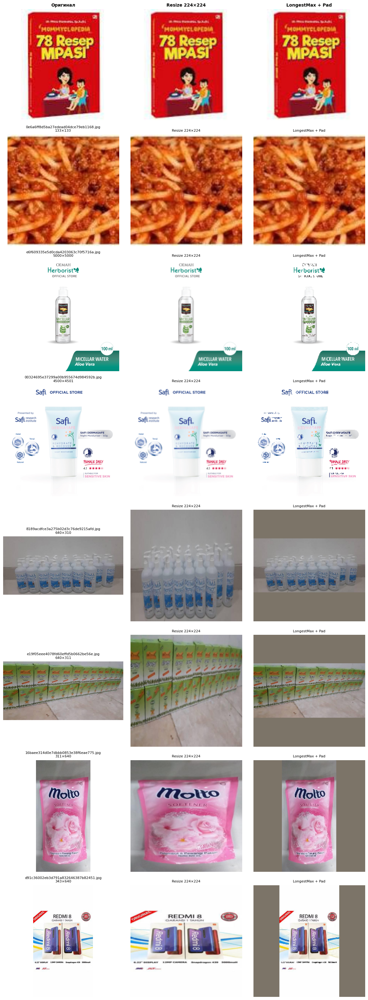

In [34]:
visualize_extreme_images(sample_df) # Показывает изображения с граничными геометрическими параметрами

## Анализ текста

In [35]:
df_clean['title_len'] = df_clean['title'].apply(len)
df_clean['word_count'] = df_clean['title'].apply(lambda x: len(x.split()))

print(f"Средняя длина текста (символы): {df_clean['title_len'].mean():.1f}")
print(f"Среднее количество слов: {df_clean['word_count'].mean():.1f}")

Средняя длина текста (символы): 56.1
Среднее количество слов: 9.4


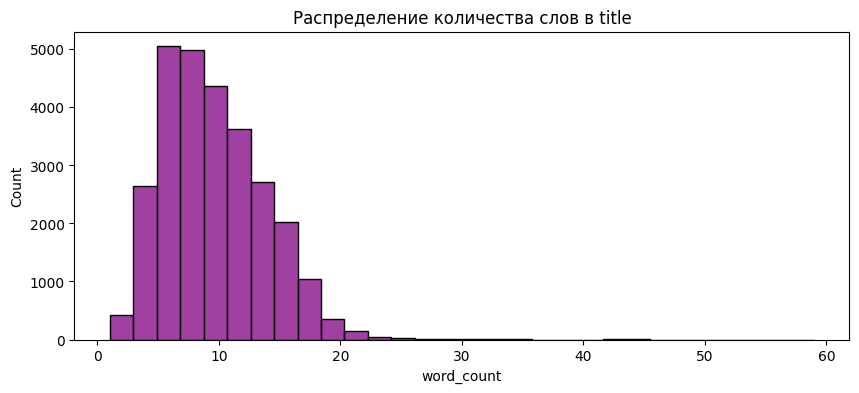

In [36]:
plt.figure(figsize=(10, 4))
sns.histplot(df_clean['word_count'], bins=30, color='purple')
plt.title('Распределение количества слов в title')
plt.show()

In [37]:
# Примеры текстов
print("Примеры текстов:")
for t in df_clean['title'].sample(15).values:
    print(f"- {t}")

Примеры текстов:
- KAOS KAKI BALET INVISIBLE SOCK - FLAT SHOES
- LONG OVERALL VENDETA ROK PANJANG JEANS PREMIUM
- Bosch Sepasang Wiper Frameless Mobil Toyota New Avanza Clear Advantage 21"  & 14"
- Hand Mixer Stand Standing Mixer Com 2 IN 1 Cosmos CM-1589 / CM1589 / CM 1589
- SARUNG TANGAN & KAKI BABY /pasang  RIB 1,900
- DR Pure Cream Set 3in1 Original Bpom
- SARUNG BATIK / SARUNG BATIK CAP / SARUNG BATIK PRINT / SARUNG BATIK  PEKALONGAN
- (27AN.ID) COD Gelang H18 gelang Paku Besi  gelang paku Aksesoris tangan Cantik Murah gelang B14
- Promag Tablet 1 Box
- CINTA UNTUK PEREMPUAN YANG TIDAK SEMPURNA KARYA NAJELAA SHIHAB
- Jilbab Instan Khimar Nadhira 3 in 1 Jersey - Kerudung Wanita
- Viva Hair Tonic Anti Dandruff
- " READY " MS Glow Luminous Glowing Serum
- alat pengasah pisau gunting otomatis multifungsi / swifty sharp
- Blackmatte custom back print lebih rapi


In [38]:
# Повторяемость текста
unique_titles = df_clean['title'].nunique()
print(f"\nУникальных текстов: {unique_titles} из {len(df_clean)} ({unique_titles/len(df_clean)*100:.1f}%)")

# Одинаковые ли тексты у одного label_group?
titles_per_group = df_clean.groupby('label_group')['title'].nunique()
print(f"Среднее число уникальных текстов на один класс: {titles_per_group.mean():.2f}")


Уникальных текстов: 26611 из 27498 (96.8%)
Среднее число уникальных текстов на один класс: 2.69


In [39]:
# Одинаковый текст, но разные label_group (разные товары)
same_text_diff_group = df_clean.groupby('title')['label_group'].nunique()
print(f"Случаев 'Одинаковый текст - разные товары (label_group)': {(same_text_diff_group > 1).sum()}")

Случаев 'Одинаковый текст - разные товары (label_group)': 43


## Вычисление значения Mean-padding

In [40]:
train_df = train_split(df_clean) #Вычисляем только на train, чтобы избежать утечки данных

Train: 19411 (6930 групп)


In [41]:
DATASET_MEAN_COLOR = compute_dataset_mean_color(train_df)
print(f"Средний цвет train-выборки (RGB): {DATASET_MEAN_COLOR}")

Средний цвет датасета:   0%|          | 0/19411 [00:00<?, ?it/s]

Средний цвет train-выборки (RGB): (192, 183, 178)
